High count transposed shape: (3034, 192, 240)
Low count transposed shape: (3034, 192, 240)
Shape einzelnes High-Count-Bild: (192, 240)
Shape einzelnes Low-Count-Bild: (192, 240)


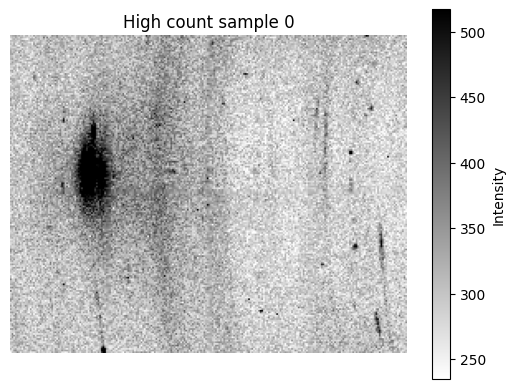

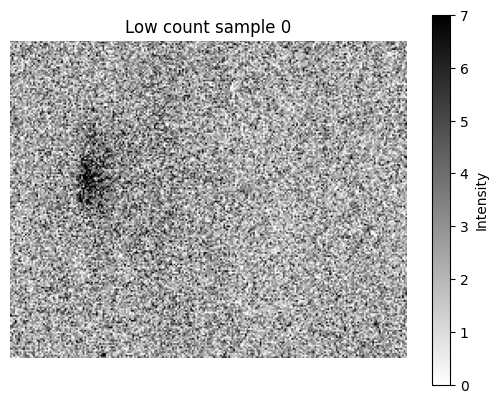

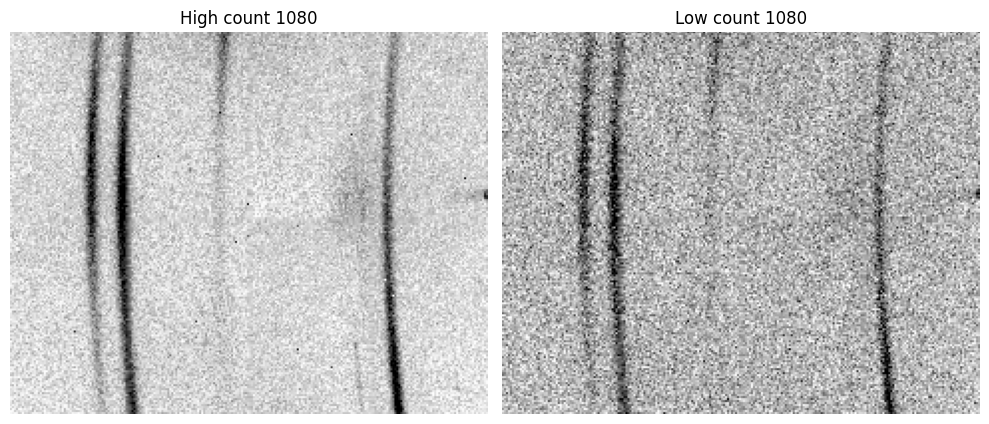

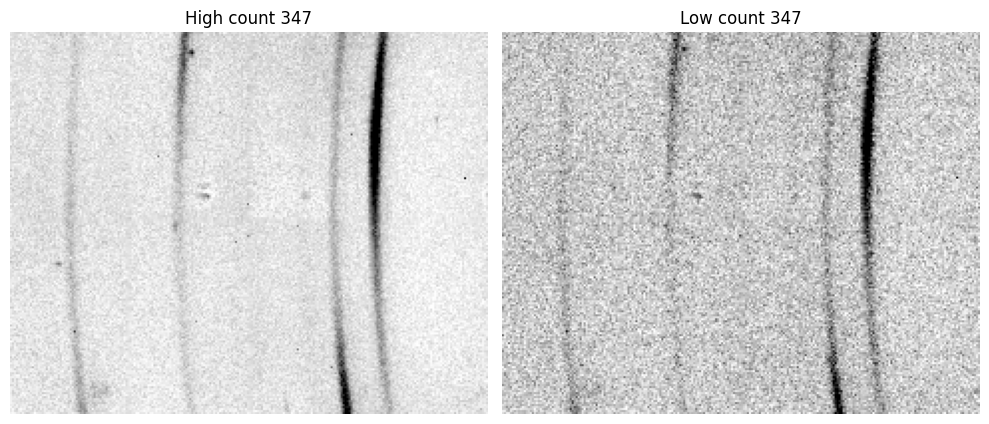

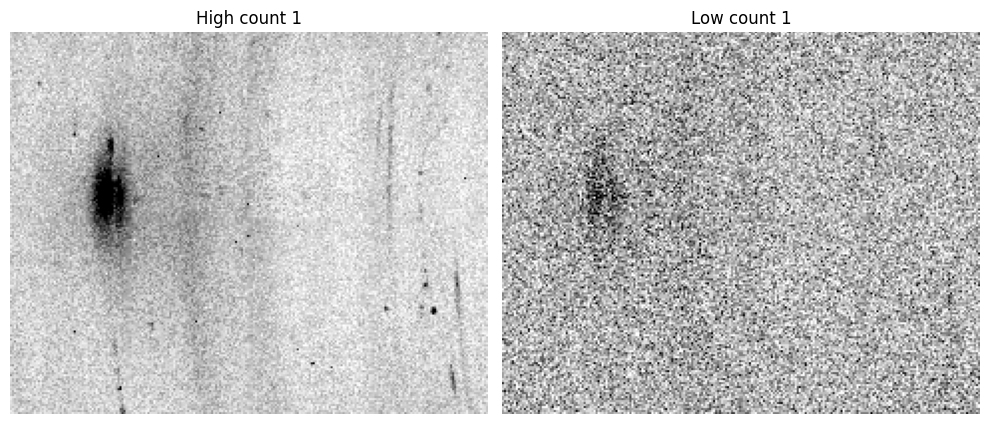

...

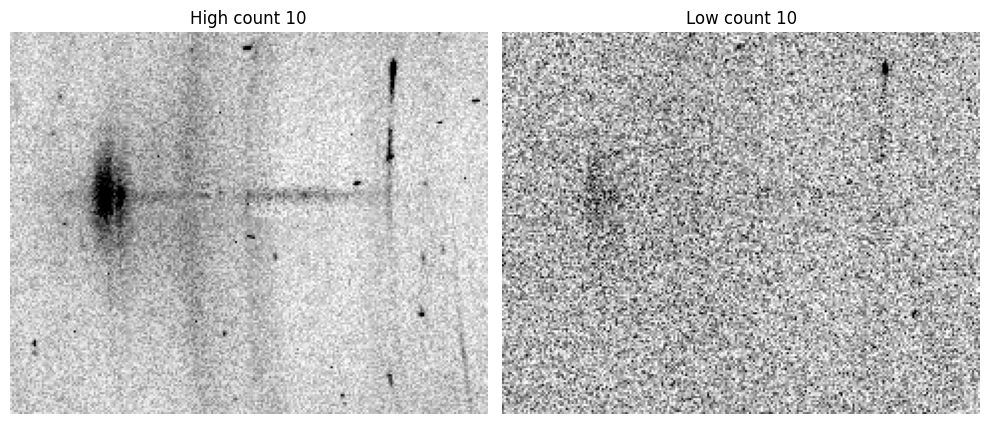

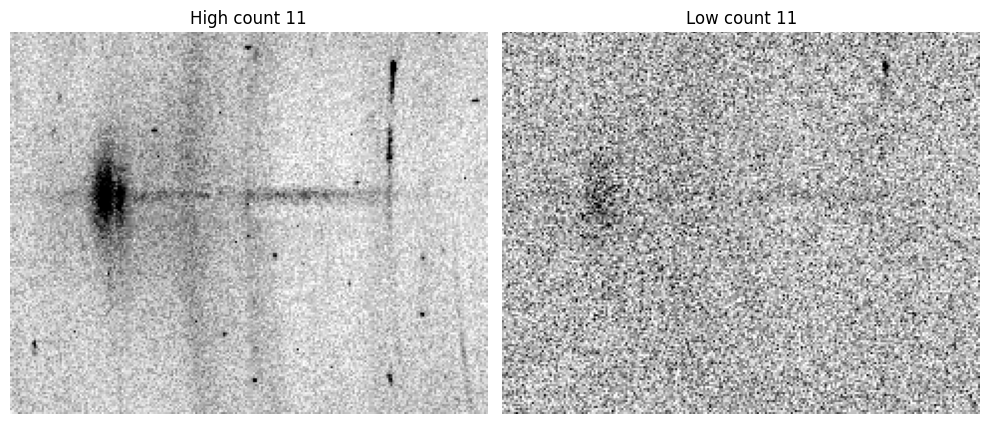

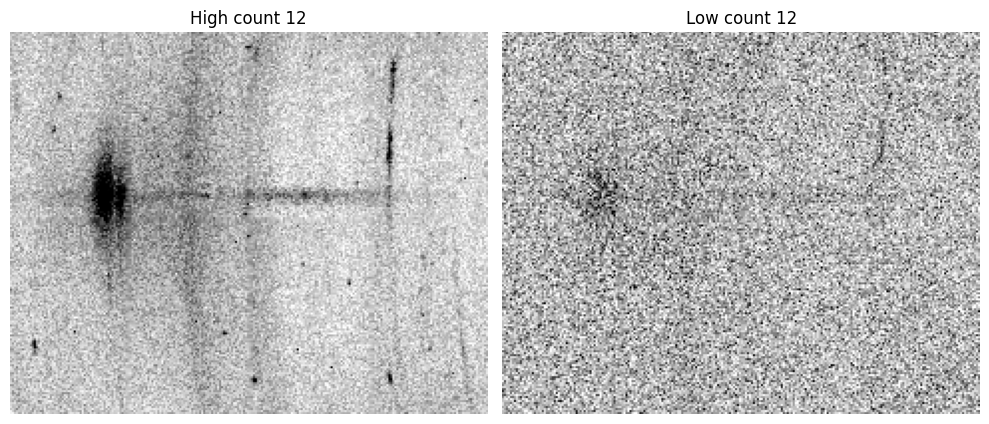

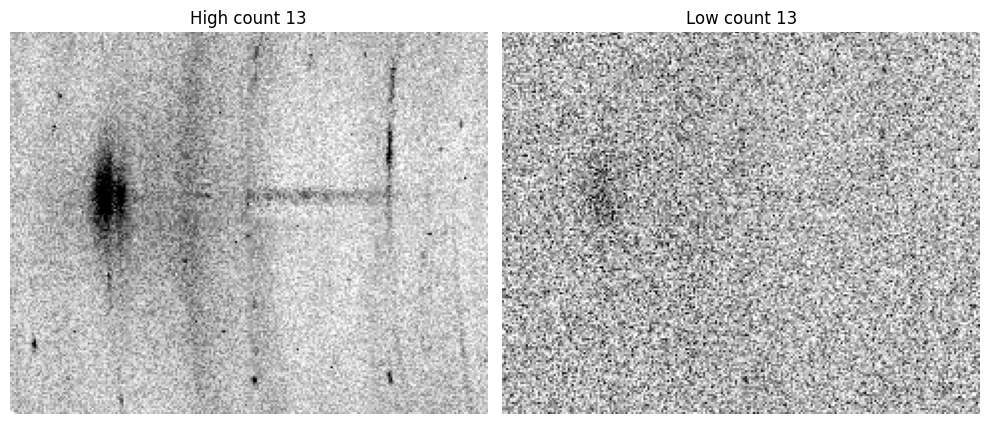

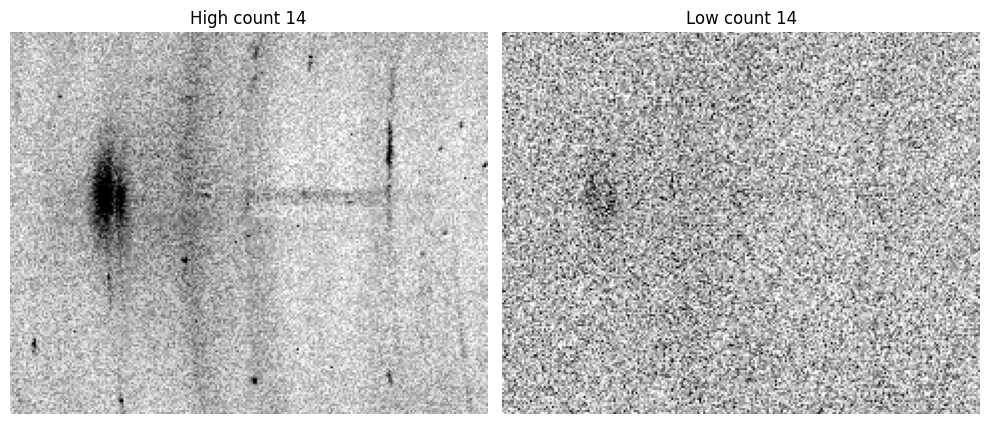

In [17]:
import h5py
import matplotlib.pyplot as plt
import numpy as np


def show_image(img, title="Image"):
    # Dynamischen Bereich setzen (z.B. 1. bis 99. Perzentil)
    vmin, vmax = np.percentile(img, (1, 99))
    
    plt.imshow(img, cmap="gray_r", origin="lower", aspect="equal", vmin=vmin, vmax=vmax)
    plt.title(title)
    plt.axis("off")
    plt.colorbar(label="Intensity")
    plt.show()


def show_pair(high_img, low_img, idx, p_low=1, p_high=99.5):
    # Per-Bild-Perzentile (separat für High und Low)
    def robust_minmax(img):
        vals = img.ravel()
        # Wenn alles (fast) gleich ist, fallback auf min/max
        vmin, vmax = np.percentile(vals, (p_low, p_high))
        if not np.isfinite(vmin) or not np.isfinite(vmax) or vmax <= vmin:
            vmin, vmax = float(vals.min()), float(vals.max() + 1e-6)
        return vmin, vmax

    vmin_h, vmax_h = robust_minmax(high_img)
    vmin_l, vmax_l = robust_minmax(low_img)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(high_img, cmap="gray_r", origin="lower", aspect="equal",
                   vmin=vmin_h, vmax=vmax_h)
    axes[0].set_title(f"High count {idx}")
    axes[0].axis("off")

    axes[1].imshow(low_img, cmap="gray_r", origin="lower", aspect="equal",
                   vmin=vmin_l, vmax=vmax_l)
    axes[1].set_title(f"Low count {idx}")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()





file_path = "test_data.hdf5"

with h5py.File(file_path, "r") as f:
    high_data = f["/high_count/data"][:]   # (192, 240, 3034)
    low_data = f["/low_count/data"][:]     # (192, 240, 3034)

# Achsen so drehen, dass es (Anzahl, Höhe, Breite) ist (Matlab hat andere Reiehnfolge)
high_data = high_data.transpose(2, 0, 1)   # (3034, 192, 240)
low_data = low_data.transpose(2, 0, 1)     # (3034, 192, 240)

print("High count transposed shape:", high_data.shape)
print("Low count transposed shape:", low_data.shape)

# Erstes Bild
high_img = high_data[0]
low_img = low_data[0]

print("Shape einzelnes High-Count-Bild:", high_img.shape)
print("Shape einzelnes Low-Count-Bild:", low_img.shape)

"""
print("High count sample 0 (Matrix):")
print(high_img)
print("\nLow count sample 0 (Matrix):")
print(low_img)
"""

# Anzeigen
show_image(high_img, "High count sample 0")
show_image(low_img, "Low count sample 0")

# Wahl der Paare
indices = np.random.choice(len(high_data), 2, replace=False)
for i in indices:
    show_pair(high_data[i], low_data[i], i)

for i in range(1, 15):
    show_pair(high_data[i], low_data[i], i)


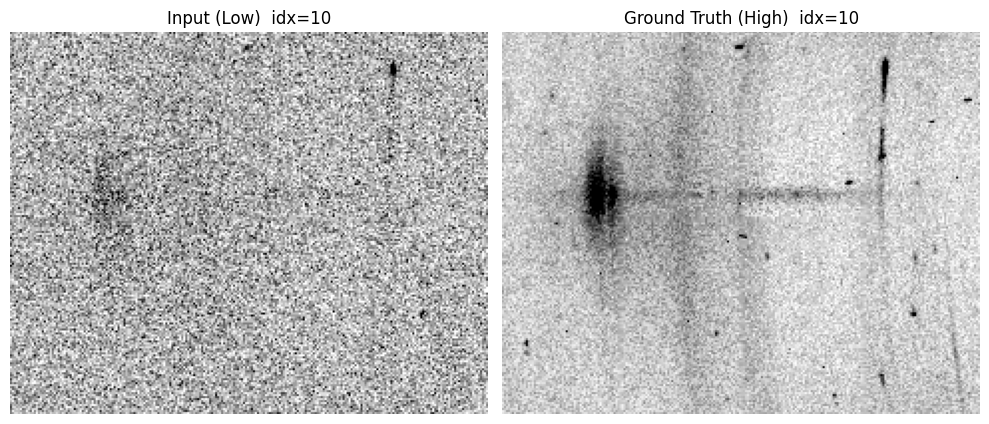

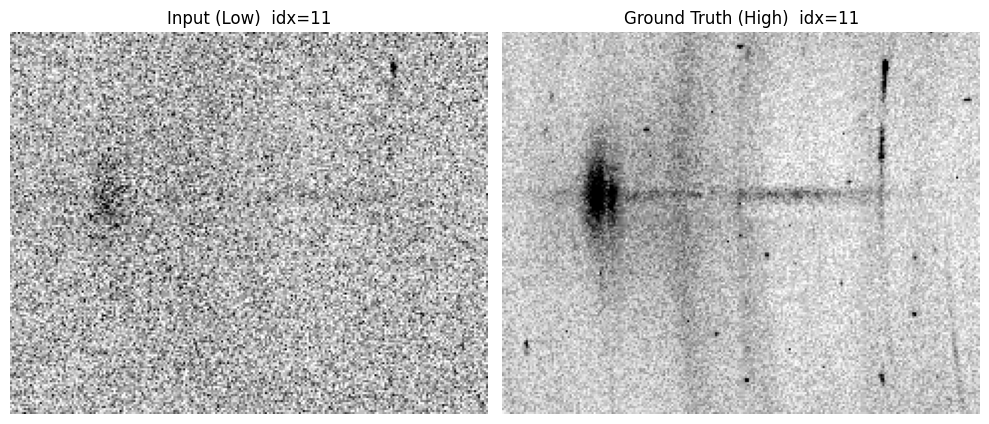

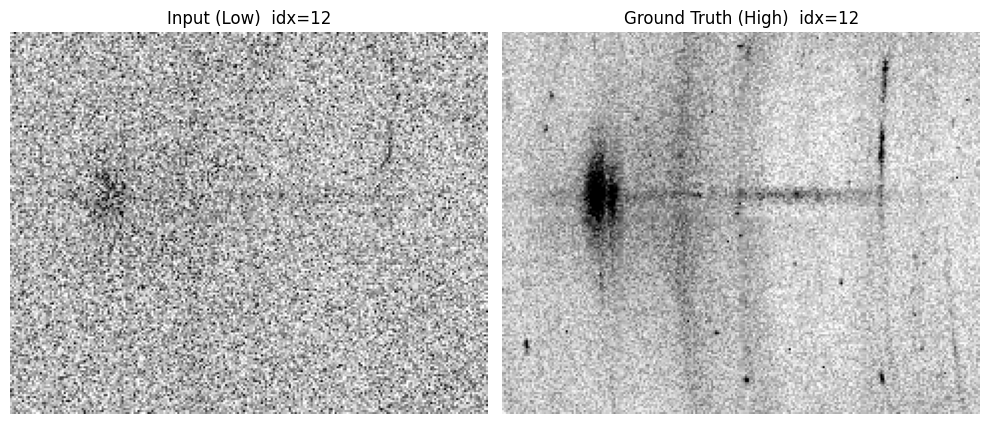

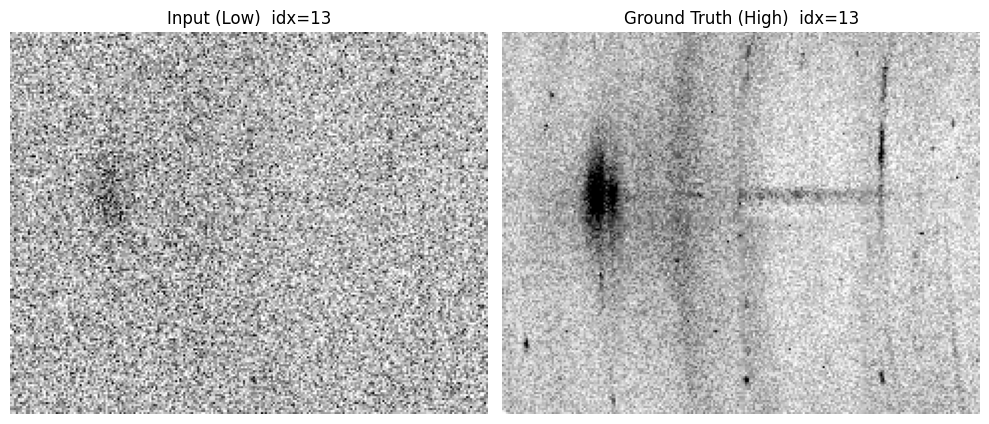

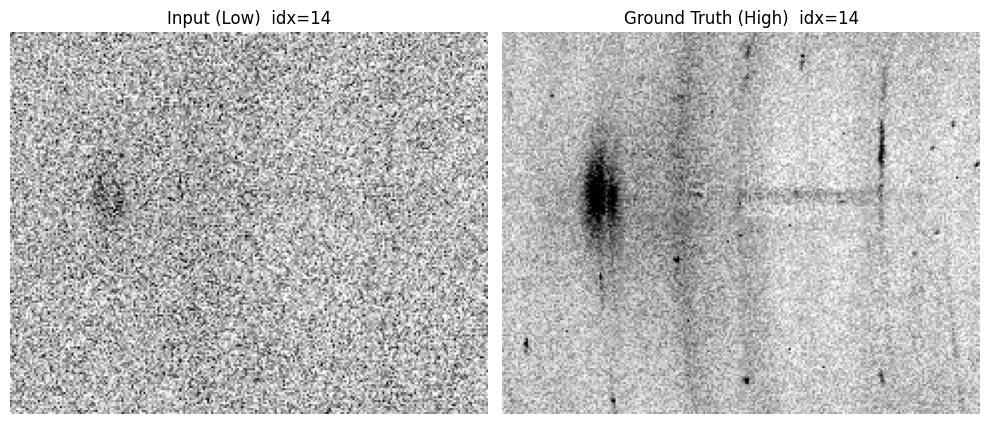

X shape (B, C, H, W): (5, 5, 192, 240)
Y shape (B, H, W):    (5, 192, 240)


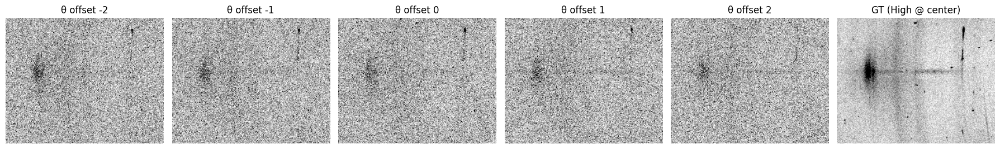

In [ ]:
# ===================== 2.5D-Windowing (Low->Input, High->GT) =====================
# Try putting C = 3,5,7 low count pictures together for evaluation

def stack_neighbors(seq, center, k, pad_mode="edge"):
    """
    seq: (N, H, W) – z.B. low_data
    center: int – Zielindex
    k: Kontexthalbbreite -> C = 2k+1
    pad_mode: "edge" = Randreplikation; None = Fehler am Rand
    return: (C, H, W)
    """
    N, H, W = seq.shape
    idxs = np.arange(center - k, center + k + 1)
    if pad_mode is None:
        if center - k < 0 or center + k >= N:
            raise IndexError("center zu nah am Rand für pad_mode=None")
    else:
        idxs = np.clip(idxs, 0, N - 1)
    return np.stack([seq[i] for i in idxs], axis=0)  # (C,H,W)

def make_25d_batch(low_seq, high_seq, centers, k, pad_mode="edge", dtype=np.float32):
    """
    X: (B, C=2k+1, H, W)  aus low_seq  (Input)
    Y: (B, H, W)          aus high_seq (Ground Truth @ center)
    """
    X, Y = [], []
    for c in centers:
        X.append(stack_neighbors(low_seq, int(c), k, pad_mode))
        Y.append(high_seq[int(c)])
    X = np.stack(X).astype(dtype)
    Y = np.stack(Y).astype(dtype)
    return X, Y

# ===================== Viewer: Input (Low) vs. Ground Truth (High) ================

def show_low_high_pair(low_img, high_img, idx, p_low=1, p_high=99.5):
    # getrennte Perzentile pro Bild (robuste Skalierung)
    def robust_minmax(img):
        vmin, vmax = np.percentile(img.ravel(), (p_low, p_high))
        if not np.isfinite(vmin) or not np.isfinite(vmax) or vmax <= vmin:
            vmin, vmax = float(img.min()), float(img.max() + 1e-6)
        return vmin, vmax

    vmin_l, vmax_l = robust_minmax(low_img)
    vmin_h, vmax_h = robust_minmax(high_img)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(low_img,  cmap="gray_r", origin="lower", aspect="equal",
                   vmin=vmin_l, vmax=vmax_l)
    axes[0].set_title(f"Input (Low)  idx={idx}")
    axes[0].axis("off")

    axes[1].imshow(high_img, cmap="gray_r", origin="lower", aspect="equal",
                   vmin=vmin_h, vmax=vmax_h)
    axes[1].set_title(f"Ground Truth (High)  idx={idx}")
    axes[1].axis("off")
    plt.tight_layout()
    plt.show()

# (optional) Kontext-Kanäle + Target gemeinsam ansehen
def show_context_and_target(X_sample, Y_sample, k, p_low=1, p_high=99.5):
    """
    X_sample: (C,H,W) = ein 2.5D Input-Fenster
    Y_sample: (H,W)   = GT
    """
    C = X_sample.shape[0]
    fig, axes = plt.subplots(1, C + 1, figsize=(3*(C+1), 3))
    for j in range(C):
        vmin, vmax = np.percentile(X_sample[j].ravel(), (p_low, p_high))
        axes[j].imshow(X_sample[j], cmap="gray_r", origin="lower", aspect="equal",
                       vmin=vmin, vmax=vmax)
        axes[j].set_title(f"θ offset {j - k}")
        axes[j].axis("off")
    vmin, vmax = np.percentile(Y_sample.ravel(), (p_low, p_high))
    axes[-1].imshow(Y_sample, cmap="gray_r", origin="lower", aspect="equal",
                    vmin=vmin, vmax=vmax)
    axes[-1].set_title("GT (High @ center)")
    axes[-1].axis("off")
    plt.tight_layout()
    plt.show()

# ===================== Beispiele ================================================

# 1) Ein paar Low/High-Paare (nur jeweilige Einzelbilder, wie gewünscht)
for i in range(10, 15):  # z.B. 10..14
    show_low_high_pair(low_data[i], high_data[i], i)

# 2) 2.5D-Inputs mit k=2 (C=5 Kanäle), Indizes 10..14
k = 2
centers = np.arange(10, 15)
X, Y = make_25d_batch(low_data, high_data, centers, k, pad_mode="edge")
print("X shape (B, C, H, W):", X.shape)  # (5, 5, 192, 240)
print("Y shape (B, H, W):   ", Y.shape)  # (5, 192, 240)

# Ein Sample komplett ansehen: Kontextkanäle + Ground Truth
show_context_and_target(X[0], Y[0], k)
